<a href="https://colab.research.google.com/github/feodosiya/Classic_ML_hw/blob/main/hw5/AI_HW5_boosting_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашняя работа: прогнозирование заработной платы и кластеризация типов движений**

### **Постановка задачи:**

В этой работе две части:

*   В первой части вам предстоит построить алгоритм на основе бустинга для прогнозирования зарплаты
*   Во второй части вам предстоит кластеризовать типы движений по имеющимся данным с акселерометров и гироскопов

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**


# **Часть 1. Прогнозирование заработной платы при помощи бустинга**

**Количество баллов:** 7

## **Постановка задачи:**

Данные выгружены и лежат в файле `ds_salary.csv`. Вам доступны описания признаков и значения целевой переменной.

**Ваша задача:** построение модели бустинга и оценка данной модели.

## **Описание даных**

- work_year: год, в который взяты данные;
- experience_level: уровень опыта, кодируемый как SE, MI EN или EX
- employment_type: тип занятости (FT, PT, CT, FL)
- job_title: название рабочей позиции в компании;
- salary: зараплата на позиции;
- salary_currency: валюта в которой начисляют зарплату;
- employee_residence: страна или регион проживания сотрудника
- remote_ratio: процент удаленки, предлагаемый в компании (0, 50, 100)
- company_location: местоположение компании
- company_size: размер компании, оцененный как S, M, L
- salary_in_usd: целевая переменная


Как всегда, загрузим набор данных.

In [1]:
import pandas as pd

In [ ]:
df = pd.read_csv("https://github.com/hse-ds/iad-intro-ds/raw/refs/heads/master/2023/homeworks/hw-08-boosting/ds_salaries.csv")

In [ ]:
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


## **Задание 1 (0.3 балла)**

Вам даны описания переменных. Проверьте, что категориальные признаки, категории которых перечислены, не имеют ошибочных значений. Для этого:

- Напишите цикл, пробегающий по выбранным признакам и оценивающий, что в них нет лишних значений;

In [ ]:
for col in ['experience_level', 'employment_type', 'remote_ratio', 'company_size']:
  print(df[col].unique()) # все хорошо

['SE' 'MI' 'EN' 'EX']
['FT' 'CT' 'FL' 'PT']
[100   0  50]
['L' 'S' 'M']


## **Задание 2 (0.3 балла)**

Проведите базовые шаги оценки качества данных.
- Есть есть проблемы, устраните их;
- Если нет проблем, кратко опишите это.

In [ ]:
df.isnull().sum() # пропусков на первый взгляд нет

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [ ]:
df.describe(include='object')

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,3755,3755,3755,3755,3755,3755,3755
unique,4,4,93,20,78,72,3
top,SE,FT,Data Engineer,USD,US,US,M
freq,2516,3718,1040,3224,3004,3040,3153


In [ ]:
df.describe() # надо будет стандартизировать. еще salary_usd по смыслу явно коррелирует с salary

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


In [ ]:
df.duplicated().sum()

1171

In [ ]:
df = df.drop_duplicates()

In [ ]:
df.shape

(2584, 11)

In [ ]:
(df['salary'] < 0).any()

False

## **Задание 3 (0.3 балла)**

Вернитесь к описанию признаков.
- Проверьте, все ли признаки соответствуют постановке задачи? Если есть лишние признаки, удалите их и обоснуйте удаление, если нет, сделайте вывод о релевантности (достаточно в одну-две строки)
- Зафиксируйте, в каких признаках много категорий.

In [ ]:
df = df.drop(columns=['salary', 'salary_currency']) # salary_in_usd — целевая переменная, salary (в разной валюте) нам не нужен

print("\nКоличество уникальных значений в категориальных признаках:")
for col in df.select_dtypes('object').columns:
    print(f"{col}: {df[col].nunique()}")


Количество уникальных значений в категориальных признаках:
experience_level: 4
employment_type: 4
job_title: 93
employee_residence: 78
company_location: 72
company_size: 3


**employee_residence, job_title, company_location** - много категорий, закодировать все может быть не лучшим решением

## **Задание 4 (0.2 балла)**

Разделите выборку на train, test (80%, 20%).

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop('salary_in_usd', axis=1),
                                                    df.salary_in_usd, test_size=0.2, random_state=42)

## **Задание 5 (0.3 балла)**

Будем проверять два сценария. Первый — построение модели только на непрерывных признаках, а второй — построение с категориальными. В этом задании подготовьте всё, чтобы проверить валидность обоих сценариев. А именно:

- Выделите данные для тренировки и теста для непрерывных признаков
- Выделите данные для тренировки и теста для непрерывных + категориальных признаков, пока ничего не кодируйте.

In [ ]:
X_train.select_dtypes('number') # уныло как-то... к тому же work_year - по-хорошему дискретный признак, remote_ratio - категориальный. но пока сделаю так

,work_year,remote_ratio
25,2023,0
2647,2022,0
2624,2022,0
2565,2022,100
2390,2022,0
...,...,...
2477,2022,100
1656,2023,0
1711,2023,0
1936,2022,0


In [ ]:
X_train_num, X_test_num = X_train.select_dtypes('number'), X_test.select_dtypes('number')

## **Задание 6 (0.2 балла)**

- Обучите модель линейной регресии на числовых признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, root_mean_squared_error

model = LinearRegression()
model.fit(X_train_num, y_train)

y_pred = model.predict(X_test_num)
print('mape', mean_absolute_percentage_error(y_test, y_pred))
print('rmse', root_mean_squared_error(y_test, y_pred))

# плохо

mape 0.829056639955772
rmse 64000.532625649634


## **Задание 8 (0.2 балла)**

- Обучите модель бустинга (любую из трех библиотек catboost, xgboost, lightgbm) с гиперпараметрами по умолчанию на непрерывных признаках и оцените её качество через mape и rmse;
- Сделайте вывод о качестве построенной модели;

In [ ]:
!pip install catboost -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.4 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor, Pool, metrics, cv

model = CatBoostRegressor(logging_level='Silent')

model.fit(X_train_num, y_train)

In [ ]:
y_pred_cb = model.predict(X_test_num)
print('mape', mean_absolute_percentage_error(y_test, y_pred_cb))
print('rmse', root_mean_squared_error(y_test, y_pred_cb))

# чуть лучше, но все еще не очень

mape 0.7708443769690209
rmse 62433.34798150245


## **Задание 9 (0.8 балла)**

Теперь подключим категориальные признаки. Но попроубем разные стратегии предобработки.

**1:**
- Предобработайте категориальные признаки при помощи OHE
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**2:**
- Предобработайте категориальные признаки при помощи LabelEncoding
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

**3:**
- Предобработайте категориальные признаки при помощи MeanTargetEnc
- Постройте модель бустинга и линейную регрессию
- Оцените качество обеих моделей

Сделайте выводы по построениям 1-3. Выберите лучшую модель и дальше поработайте с ней.

In [ ]:
# 1

from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

X_train_cat = ohe.fit_transform(X_train.drop(['work_year', 'remote_ratio'], axis=1))
X_train_cat = pd.DataFrame(X_train_cat, columns=ohe.get_feature_names_out(X_train.drop(['work_year', 'remote_ratio'], axis=1).columns), index=X_train.index)

X_test_cat = ohe.transform(X_test.drop(['work_year', 'remote_ratio'], axis=1))
X_test_cat = pd.DataFrame(X_test_cat, columns=ohe.get_feature_names_out(X_test.drop(['work_year', 'remote_ratio'], axis=1).columns), index=X_test.index)

X_train_ohe = pd.concat([X_train[['work_year', 'remote_ratio']], X_train_cat], axis=1)
X_test_ohe = pd.concat([X_test[['work_year', 'remote_ratio']], X_test_cat], axis=1)

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2, 3, 4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [ ]:
import xgboost as xgb

lr_ohe = LinearRegression().fit(X_train_ohe, y_train)
xgb_ohe = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train_ohe, y_train)

y_pred_lr_ohe = lr_ohe.predict(X_test_ohe)
y_pred_xgb_ohe = xgb_ohe.predict(X_test_ohe)

print("OHE - LR: mape =", mean_absolute_percentage_error(y_test, y_pred_lr_ohe),
      "rmse =", root_mean_squared_error(y_test, y_pred_lr_ohe))
print("OHE - XGBoost: MAPE =", mean_absolute_percentage_error(y_test, y_pred_xgb_ohe),
      "RMSE =", root_mean_squared_error(y_test, y_pred_xgb_ohe))

# лучше!

OHE - LR: mape = 0.46339295295516686 rmse = 53521.03631159829
OHE - XGBoost: MAPE = 0.4245251417160034 RMSE = 53262.71484375


In [ ]:
# 2
from sklearn.preprocessing import LabelEncoder

X_train_le = X_train.drop(['work_year', 'remote_ratio'], axis=1).copy()
X_test_le = X_test.drop(['work_year', 'remote_ratio'], axis=1).copy()
le = LabelEncoder()

for col in X_train.drop(['work_year', 'remote_ratio'], axis=1).columns:
    X_train_le[col] = le.fit_transform(X_train_le[col])
    X_test_le[col] =  X_test_le[col].apply(lambda x: le.transform([x])[0] if x in le.classes_ else -1)

X_train_le = pd.concat([X_train[['work_year', 'remote_ratio']], X_train_le], axis=1)
X_test_le = pd.concat([X_test[['work_year', 'remote_ratio']], X_test_le], axis=1)


In [ ]:
lr_le = LinearRegression().fit(X_train_le, y_train)
xgb_le = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train_le, y_train)

y_pred_lr_le = lr_le.predict(X_test_le)
y_pred_xgb_le = xgb_le.predict(X_test_le)

print("LE - LR: mape =", mean_absolute_percentage_error(y_test, y_pred_lr_le),
      "rmse =", root_mean_squared_error(y_test, y_pred_lr_le))
print("LE - XGBoost: MAPE =", mean_absolute_percentage_error(y_test, y_pred_xgb_le),
      "RMSE =", root_mean_squared_error(y_test, y_pred_xgb_le))


LE - LR: mape = 0.5717883928379242 rmse = 55931.656800026096
LE - XGBoost: MAPE = 0.6039267182350159 RMSE = 60344.45703125


In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.1 MB/s eta 0:00:00


In [ ]:
# 3

from category_encoders import TargetEncoder

X_train_mte = X_train.drop(['work_year', 'remote_ratio'], axis=1).copy()
X_test_mte = X_test.drop(['work_year', 'remote_ratio'], axis=1).copy()
target_enc = TargetEncoder(smoothing=1)

X_train_mte = target_enc.fit_transform(X_train_mte, y_train)
X_test_mte = target_enc.transform(X_test_mte)

X_train_mte = pd.concat([X_train[['work_year', 'remote_ratio']], X_train_mte], axis=1)
X_test_mte = pd.concat([X_test[['work_year', 'remote_ratio']], X_test_mte], axis=1)


In [ ]:
lr_mte = LinearRegression().fit(X_train_mte, y_train)
xgb_mte = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train_mte, y_train)

y_pred_lr_mte = lr_mte.predict(X_test_mte)
y_pred_xgb_mte = xgb_mte.predict(X_test_mte)

print("MTE - LR: mape =", mean_absolute_percentage_error(y_test, y_pred_lr_mte),
      "rmse =", root_mean_squared_error(y_test, y_pred_lr_mte))
print("LE - XGBoost: MAPE =", mean_absolute_percentage_error(y_test, y_pred_xgb_mte),
      "RMSE =", root_mean_squared_error(y_test, y_pred_xgb_mte))

MTE - LR: mape = 0.4886648165007478 rmse = 53310.68832469402
LE - XGBoost: MAPE = 0.42991816997528076 RMSE = 54015.77734375


## **Задание 10 (0.5 балла)**

Покажите, где ошибается ваша модель. Выведите топ 20 примеров с наибольшей ошибкой. Проанализируйте их. Какие выводы можно сделать? Что стоит изменить в данных чтобы улучшить качество модели?

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

errors = pd.DataFrame({
    "real": y_test,
    "pred": y_pred_xgb_ohe,
    "abs_error": abs(y_test - y_pred_xgb_ohe)})

errors = errors.join(X_test)

errors.sort_values(by="abs_error", ascending=False)[:20]

,real,pred,abs_error,work_year,experience_level,employment_type,job_title,employee_residence,remote_ratio,company_location,company_size
2011,430967,59966.750000,371000.250000,2022,MI,FT,Data Analyst,GB,0,GB,M
1288,385000,130391.484375,254608.515625,2023,SE,FT,Data Analyst,US,0,US,M
3485,38400,204296.750000,165896.750000,2021,MI,FT,Applied Machine Learning Scientist,VN,100,US,M
1695,72000,233453.156250,161453.156250,2023,SE,FT,Applied Scientist,US,0,US,L
2406,315000,158376.140625,156623.859375,2022,SE,FT,Data Engineer,US,100,US,M
3545,250000,101167.156250,148832.843750,2020,EN,FT,Machine Learning Engineer,US,50,US,L
3517,68428,211635.484375,143207.484375,2020,SE,FT,Data Scientist,GR,100,US,L
3713,120000,262952.343750,142952.343750,2020,SE,FT,Data Scientist,US,50,US,L
3155,200000,65819.851562,134180.148438,2022,MI,FT,AI Scientist,IN,100,US,L
2022,10000,142944.578125,132944.578125,2022,SE,FT,3D Computer Vision Researcher,CA,50,AL,S


**Матрица после кодирования очень разреженная, но при этом информативных признаков как будто не так много для модели. По первым двум вакансиям на аналитика в компании M сложно предположить, что зарплата будет сильно высокой.**

## **Задание 11 (0.5 балла)**

Придумайте признаки для улучшения качества модели на основе предыдущего пункта. Как вам кажется какими признаками можно улучшить качетсво модели? Реализуйте признаки и проверьте улучшилось ли качество модели.

**Примечание:**
Полный балл за задание ставится даже при отсутствии улучшения качества модели, важно попробовать проверить свои гипотезы и сделать выводы.

In [ ]:
df.job_title.unique()

array(['Principal Data Scientist', 'ML Engineer', 'Data Scientist',
       'Applied Scientist', 'Data Analyst', 'Data Modeler',
       'Research Engineer', 'Analytics Engineer',
       'Business Intelligence Engineer', 'Machine Learning Engineer',
       'Data Strategist', 'Data Engineer', 'Computer Vision Engineer',
       'Data Quality Analyst', 'Compliance Data Analyst',
       'Data Architect', 'Applied Machine Learning Engineer',
       'AI Developer', 'Research Scientist', 'Data Analytics Manager',
       'Business Data Analyst', 'Applied Data Scientist',
       'Staff Data Analyst', 'ETL Engineer', 'Data DevOps Engineer',
       'Head of Data', 'Data Science Manager', 'Data Manager',
       'Machine Learning Researcher', 'Big Data Engineer',
       'Data Specialist', 'Lead Data Analyst', 'BI Data Engineer',
       'Director of Data Science', 'Machine Learning Scientist',
       'MLOps Engineer', 'AI Scientist', 'Autonomous Vehicle Technician',
       'Applied Machine Learning Sc

In [ ]:
df.nunique()

,0
work_year,4
experience_level,4
employment_type,4
job_title,93
salary_in_usd,1035
employee_residence,78
remote_ratio,3
company_location,72
company_size,3


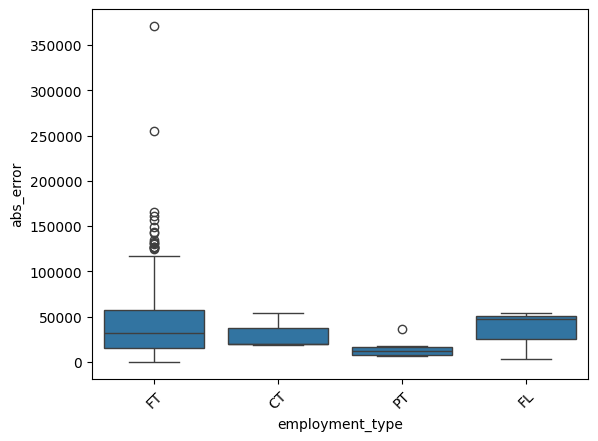

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x=errors["employment_type"], y=errors["abs_error"])
plt.xticks(rotation=45)
plt.show()

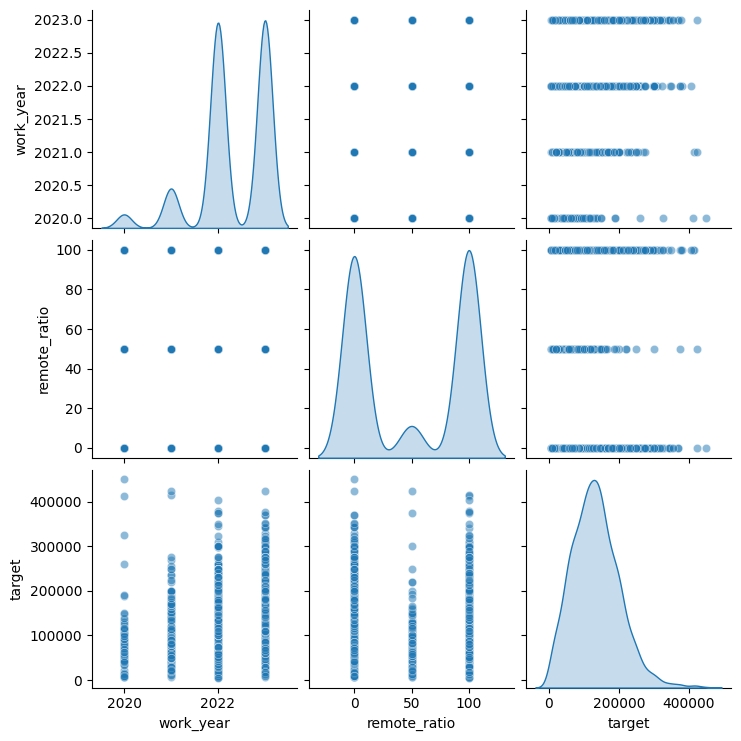

In [ ]:
sns.pairplot(X_train.assign(target=y_train), diag_kind="kde", plot_kws={"alpha": 0.5})
plt.show()

In [ ]:
df.job_title.value_counts()

,count
job_title,
Data Engineer,598
Data Scientist,538
Data Analyst,396
Machine Learning Engineer,206
Analytics Engineer,91
Research Scientist,65
Data Architect,64
Data Science Manager,52
ML Engineer,34


In [ ]:
# интересно посмотреть, изменится ли результат при сочетании job_title с experience level
# может оказаться, что на некоторых позициях зарплата на младших грейдах выше, в том время как на старших - не самая большая
# еще может быть полезно объединить company_location и company_size
# но чтоб не плодить столбцы после OHE сгруппирую значения

X_train_ohe_v2 = X_train.drop(['work_year', 'remote_ratio'], axis=1).copy()
X_test_ohe_v2 = X_test.drop(['work_year', 'remote_ratio'], axis=1).copy()

In [ ]:
job_title_groups = {
    "ML": [
        "Data Scientist", "Applied Data Scientist", "Lead Data Scientist", "Machine Learning Engineer",
        "Applied Machine Learning Engineer", "Machine Learning Research Engineer", "Machine Learning Researcher",
        "Machine Learning Developer", "Machine Learning Scientist", "Machine Learning Software Engineer",
        "Machine Learning Manager", "Lead Machine Learning Engineer", "Head of Machine Learning",
        "Principal Machine Learning Engineer", "AI Scientist", "AI Developer", "AI Programmer",
        "Deep Learning Engineer", "Deep Learning Researcher", "Computer Vision Engineer",
        "Computer Vision Software Engineer", "Applied Machine Learning Scientist", "Product Data Scientist", 'NLP Engineer',
        'Autonomous Vehicle Technician',  '3D Computer Vision Researcher', 'Data Science Engineer'
    ],
    "DE": [
        "Data Engineer", "Big Data Engineer", "BI Data Engineer", "Software Data Engineer", "Cloud Data Engineer",
        "Azure Data Engineer", "Data Infrastructure Engineer", "Cloud Database Engineer", "ETL Engineer",
        "ETL Developer", "Data Operations Engineer", "Data DevOps Engineer", "Machine Learning Infrastructure Engineer",
        "MLOps Engineer", "Data Analytics Engineer", "Lead Data Engineer", 'Marketing Data Engineer'
    ],
    "Analytics": [
        "Data Analyst", "Business Data Analyst", "Financial Data Analyst", "Marketing Data Analyst",
        "Compliance Data Analyst", "Product Data Analyst", "Insight Analyst", "Staff Data Analyst", "BI Analyst",
        "BI Developer", "BI Data Analyst", "Data Analytics Specialist", "Data Quality Analyst",
        "Lead Data Analyst", "Principal Data Analyst", "Business Intelligence Engineer"
    ],
    "Management": [
        "Data Science Manager", "Data Science Lead", "Head of Data Science", "Director of Data Science",
        "Data Analytics Manager", "Data Analytics Lead", "Data Lead", "Data Science Tech Lead",
        "Data Scientist Lead", "Head of Data"
    ],
    "Architect": [
        "Data Architect", "Cloud Data Architect", "Big Data Architect", "Principal Data Engineer",
        "Data Modeler", "Principal Data Scientist"
    ],
    "Consulting": [
        "Data Analytics Consultant", "Data Science Consultant", "Data Management Specialist",
        "Data Specialist", "Data Operations Analyst"
    ]
}


job_counts = X_train_ohe_v2['job_title'].value_counts()

def map_job_title(job):
    if job_counts.get(job, 0) > 10:
        return job
    return next((category for category, jobs in job_title_groups.items() if job in jobs), "Other")


X_train_ohe_v2["job_title_gr"] = X_train_ohe_v2["job_title"].apply(map_job_title)
X_test_ohe_v2["job_title_gr"] = X_test_ohe_v2["job_title"].apply(map_job_title)

X_train_ohe_v2["job_title_gr_exp"] = X_train_ohe_v2["job_title_gr"] + "_" + X_train_ohe_v2["experience_level"]
X_test_ohe_v2["job_title_gr_exp"] = X_test_ohe_v2["job_title_gr"] + "_" + X_test_ohe_v2["experience_level"]


In [ ]:
country_groups = {
    "North America": ["US", "CA", "MX", "PR", "AS"],
    "Europe": ["GB", "DE", "ES", "FR", "PT", "NL", "GR", "IE", "AT", "PL", "DK",
               "IT", "SI", "BE", "UA", "HR", "CZ", "FI", "LU", "HU", "LT", "RO",
               "SE", "EE", "LV", "SK", "MT", "MD", "BA", "MK"],
    "Asia": ["IN", "JP", "SG", "PK", "TR", "RU", "AE", "ID", "IL", "CN", "HK",
             "IQ", "MY", "VN", "AM", "IR", "PH"],
    "South America": ["BR", "CO", "AR", "CL", "BO", "CR", "HN"],
    "Oceania": ["AU", "NZ"],
    "Africa": ["NG", "EG", "DZ", "MA", "KE", "CF", "GH", "AL"],
    "Other": [] }

loc_counts = X_train_ohe_v2['company_location'].value_counts()

def map_loc_title(loc):
    if loc_counts.get(loc, 0) >= 10:
        return loc
    return next((category for category, locs in country_groups.items() if loc in locs), "Other")


X_train_ohe_v2["company_location_gr"] = X_train_ohe_v2["company_location"].apply(map_loc_title)
X_test_ohe_v2["company_location_gr"] = X_test_ohe_v2["company_location"].apply(map_loc_title)
X_train_ohe_v2["employee_residence_gr"] = X_train_ohe_v2["employee_residence"].apply(map_loc_title)
X_test_ohe_v2["employee_residence_gr"] = X_test_ohe_v2["employee_residence"].apply(map_loc_title)

#X_train_ohe_v2["location_size"] = X_train_ohe_v2["company_location_gr"] + "_" + X_train_ohe_v2["company_size"]
#X_test_ohe_v2["location_size"] = X_test_ohe_v2["company_location_gr"] + "_" + X_test_ohe_v2["company_size"]


In [ ]:
X_train_ohe_v2.drop(['job_title', 'employee_residence', 'company_location', 'experience_level', 'job_title_gr'], axis=1, inplace=True)
X_test_ohe_v2.drop(['job_title', 'employee_residence', 'company_location', 'experience_level', 'job_title_gr'], axis=1, inplace=True)

In [ ]:
ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

X_train_cat = ohe.fit_transform(X_train_ohe_v2)
X_train_cat = pd.DataFrame(X_train_cat, columns=ohe.get_feature_names_out(X_train_ohe_v2.columns), index=X_train_ohe_v2.index)

X_test_cat = ohe.transform(X_test_ohe_v2)
X_test_cat = pd.DataFrame(X_test_cat, columns=ohe.get_feature_names_out(X_test_ohe_v2.columns), index=X_test_ohe_v2.index)

X_train_ohe = pd.concat([X_train[['work_year', 'remote_ratio']], X_train_cat], axis=1)
X_test_ohe = pd.concat([X_test[['work_year', 'remote_ratio']], X_test_cat], axis=1)

xgb_ohe_v2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42).fit(X_train_ohe, y_train)
y_pred_xgb_ohe_2 = xgb_ohe_v2.predict(X_test_ohe)

print("OHE - XGBoost: MAPE =", mean_absolute_percentage_error(y_test, y_pred_xgb_ohe_2),
      "RMSE =", root_mean_squared_error(y_test, y_pred_xgb_ohe_2))


/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [2] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


OHE - XGBoost: MAPE = 0.4365398585796356 RMSE = 54387.78125


**Ну как-то не очень получилось выиграть в качестве, зато количество признаков подсократили**.

## **Задание 12 (1 балл)**

Поупражняемся с разными бустингами!

- Используйте catboost.
- Обучите модель — на полном наборе данных с категориальными признаками.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


**Примечание:**
Замерять скорость = смотреть, как долго исполняется код.

In [ ]:
%%time

from catboost import CatBoostRegressor, Pool, metrics, cv

model = CatBoostRegressor(logging_level='Silent')

model.fit(X_train_ohe, y_train)

CPU times: user 1.57 s, sys: 239 ms, total: 1.81 s
Wall time: 1.05 s


In [ ]:
y_pred_cb = model.predict(X_test_ohe)
print('mape', mean_absolute_percentage_error(y_test, y_pred_cb))
print('rmse', root_mean_squared_error(y_test, y_pred_cb))

mape 0.4391892055431554
rmse 52443.66748538058


In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 6.1 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.metrics import mean_absolute_percentage_error, make_scorer
from sklearn.model_selection import KFold, cross_val_score
import numpy as np


def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 100, 1000, step=50),
        "depth": trial.suggest_int("depth", 4, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-5, 10, log=True),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
        "random_strength": trial.suggest_float("random_strength", 0.0, 1.0),
        "loss_function": "MAPE",
        "eval_metric": "MAPE",
        "logging_level": "Silent",
        "random_seed": 42}

    model = CatBoostRegressor(**params)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train_ohe, y_train, cv=kf, scoring=make_scorer(root_mean_squared_error, greater_is_better=False), n_jobs=-1)

    return -scores.mean()

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print("Лучшие параметры:", study.best_params)

[I 2025-02-26 17:53:49,684] A new study created in memory with name: no-name-2daa2a60-9f26-4759-af1c-1f37109c3626
[I 2025-02-26 17:54:18,980] Trial 0 finished with value: 88937.73560440574 and parameters: {'iterations': 800, 'depth': 9, 'learning_rate': 0.07641187922456062, 'l2_leaf_reg': 0.021621466051706215, 'border_count': 168, 'bagging_temperature': 0.7871479701132672, 'random_strength': 0.9057247134540722}. Best is trial 0 with value: 88937.73560440574.
[I 2025-02-26 17:54:26,771] Trial 1 finished with value: 90081.84344789518 and parameters: {'iterations': 900, 'depth': 6, 'learning_rate': 0.016360933988509147, 'l2_leaf_reg': 0.04089432614760992, 'border_count': 210, 'bagging_temperature': 0.7405579030675659, 'random_strength': 0.8316558721426466}. Best is trial 0 with value: 88937.73560440574.
/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too

Лучшие параметры: {'iterations': 1000, 'depth': 12, 'learning_rate': 0.2931271869444187, 'l2_leaf_reg': 9.785351656475589, 'border_count': 239, 'bagging_temperature': 0.5797604056973751, 'random_strength': 0.8327870362491908}


In [ ]:
%%time

best_model = CatBoostRegressor(**study.best_params, logging_level='Silent')
best_model.fit(X_train_ohe, y_train)

y_pred_best = best_model.predict(X_test_ohe)
print("MAPE:", mean_absolute_percentage_error(y_test, y_pred_best))
print("RMSE:", root_mean_squared_error(y_test, y_pred_best))

# ну(

MAPE: 0.46001650456359144
RMSE: 55297.27808352299
CPU times: user 24.8 s, sys: 1.22 s, total: 26 s
Wall time: 21.4 s


## **Задание 13 (1 балл)**

- Используйте xgboost.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.



In [ ]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=50),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 10),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-5, 10, log=True),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-5, 10, log=True),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "objective": "reg:squarederror",
        "random_state": 42}

    model = xgb.XGBRegressor(**params)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train_ohe, y_train, cv=kf, scoring=make_scorer(root_mean_squared_error, greater_is_better=False), n_jobs=-1)

    return -scores.mean()

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print("Лучшие параметры:", study.best_params)

[I 2025-02-26 18:36:53,888] A new study created in memory with name: no-name-da58bf48-92d3-4275-8ede-f8356198f0dc
[I 2025-02-26 18:36:58,620] Trial 0 finished with value: 51300.990625 and parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.2069382581599407, 'subsample': 0.7084724172380416, 'colsample_bytree': 0.7088682521878671, 'gamma': 1.0382911471637146, 'reg_lambda': 0.3159762917662617, 'reg_alpha': 0.01252103289144044, 'min_child_weight': 6}. Best is trial 0 with value: 51300.990625.
[I 2025-02-26 18:37:04,062] Trial 1 finished with value: 51601.03984375 and parameters: {'n_estimators': 750, 'max_depth': 3, 'learning_rate': 0.010359587714297225, 'subsample': 0.8034062398681479, 'colsample_bytree': 0.6339281376972451, 'gamma': 8.366623174759951, 'reg_lambda': 0.0006493686347360376, 'reg_alpha': 1.7136751079437182, 'min_child_weight': 7}. Best is trial 0 with value: 51300.990625.
[I 2025-02-26 18:37:08,436] Trial 2 finished with value: 53101.02109375 and parameters:

Лучшие параметры: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.04119804210404583, 'subsample': 0.8787693052735637, 'colsample_bytree': 0.5594364975115395, 'gamma': 6.730331629162389, 'reg_lambda': 2.6785317286647206, 'reg_alpha': 0.0009088738440405327, 'min_child_weight': 3}


In [ ]:
%%time

best_model_xgb = xgb.XGBRegressor(**study.best_params, logging_level='Silent')
best_model_xgb.fit(X_train_ohe, y_train)

y_pred_best_xgb = best_model_xgb.predict(X_test_ohe)
print("MAPE:", mean_absolute_percentage_error(y_test, y_pred_best_xgb))
print("RMSE:", root_mean_squared_error(y_test, y_pred_best_xgb))

# немного лучше

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [18:40:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "logging_level" } are not used.

  warnings.warn(smsg, UserWarning)


MAPE: 0.44917282462120056
RMSE: 51495.75390625
CPU times: user 935 ms, sys: 10.9 ms, total: 945 ms
Wall time: 524 ms


## **Задание 14 (1 балл)**

- Используйте lgbm.
- Обучите модель — на полном наборе данных с категориальными признаками. Стратегию кодирования оставьте ту, что показала себя лучшей в пункте 9.
- Подберите оптимальные гиперпараметры.
- Оцените качество итоговой модели, скорость обучения и скорость предсказания.


In [ ]:
import lightgbm as lgb

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-5, 10, log=True),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-5, 10, log=True),
        "max_depth": trial.suggest_int("max_depth", 4, 16),
        "num_leaves": trial.suggest_int("num_leaves", 30, 500, step=10),
        "min_child_samples": trial.suggest_int("min_child_samples", 1, 50, step=2),
        "objective": "regression",
        "random_state": 42}

    model = lgb.LGBMRegressor(**params)

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train_ohe, y_train, cv=kf, scoring=make_scorer(root_mean_squared_error, greater_is_better=False), n_jobs=-1)

    return -scores.mean()

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print("Лучшие параметры:", study.best_params)

[I 2025-02-26 18:50:52,176] A new study created in memory with name: no-name-b8ec9466-adc2-4428-8024-3e2f6883a78e
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:699: UserWarning: The distribution is specified by [1, 50] and step=2, but the range is not divisible by `step`. It will be replaced by [1, 49].
  warnings.warn(
[I 2025-02-26 18:50:54,147] Trial 0 finished with value: 54511.30856898469 and parameters: {'n_estimators': 700, 'learning_rate': 0.020103495048330765, 'subsample': 0.8111211517660267, 'colsample_bytree': 0.5386961437534289, 'reg_lambda': 6.026820441962948e-05, 'reg_alpha': 0.9382344097247612, 'max_depth': 9, 'num_leaves': 60, 'min_child_samples': 43}. Best is trial 0 with value: 54511.30856898469.
[I 2025-02-26 18:50:55,546] Trial 1 finished with value: 54767.92947698666 and parameters: {'n_estimators': 450, 'learning_rate': 0.01722592367267207, 'subsample': 0.8353683539431755, 'colsample_bytree': 0.8061792873751752, 'reg_lambda': 1.1734443509644088e-

Лучшие параметры: {'n_estimators': 800, 'learning_rate': 0.013811788852866283, 'subsample': 0.9566232190553813, 'colsample_bytree': 0.6695598912637969, 'reg_lambda': 1.02791916195956, 'reg_alpha': 3.7094910975242454, 'max_depth': 9, 'num_leaves': 190, 'min_child_samples': 1}


In [ ]:
%%time

best_model_lgb = lgb.LGBMRegressor(**study.best_params)
best_model_lgb.fit(X_train_ohe, y_train)

y_pred_best_lgb = best_model_lgb.predict(X_test_ohe)
print("MAPE:", mean_absolute_percentage_error(y_test, y_pred_best_lgb))
print("RMSE:", root_mean_squared_error(y_test, y_pred_best_lgb))

# по MAPE немного лучше, по RMSE - немного хуже. в целом разница несущественная с xgb

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000723 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 260
[LightGBM] [Info] Number of data points in the train set: 2067, number of used features: 128
[LightGBM] [Info] Start training from score 133570.320271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

## **Задание 15 (0.4 балла)**

Сделайте выводы про модели и решение задачи.

- Какая из моделей показала лучший результат по качеству?
```XGBoost до и после подбора выигрывает```
- Какая из моделей показала лучший результат по качеству, скорости обучения и скорости предсказания в совокупности?
```XGBoost все еще) быстрый и качественный```
- Насколько бустинги превзошли линейную модель? Целесообразно ли их использование?
```Линейную регрессию превзошли ощутимо, целесообразно.```

# **Часть 2: кластеризация типов движений**
**Количество баллов:** 3

В этой части будем работать с набором данных Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

In [2]:
import numpy as np
import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt

#plt.style.use(['seaborn-darkgrid'])
sns.set_style('darkgrid')
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

In [4]:
X_train = pd.read_csv('samsung_train.txt', delim_whitespace=True, header=None)
y_train = pd.read_csv('samsung_train_labels.txt', delim_whitespace=True, header=None)
X_test = pd.read_csv('samsung_test.txt', delim_whitespace=True, header=None)
y_test = pd.read_csv('samsung_test_labels.txt', delim_whitespace=True, header=None)

<ipython-input-4-52e8f4cfb58a>:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  X_train = pd.read_csv('samsung_train.txt', delim_whitespace=True, header=None)
<ipython-input-4-52e8f4cfb58a>:2: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  y_train = pd.read_csv('samsung_train_labels.txt', delim_whitespace=True, header=None)
<ipython-input-4-52e8f4cfb58a>:3: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  X_test = pd.read_csv('samsung_test.txt', delim_whitespace=True, header=None)
<ipython-input-4-52e8f4cfb58a>:4: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  y_test = pd.read_csv('samsung_test_labels.txt'

In [6]:
X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


In [9]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 561 entries, 0 to 560
dtypes: float64(561)
memory usage: 31.5 MB


### **Задание 16 (0.1 балл)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [69]:
X = pd.concat([X_train, X_test], ignore_index=True)
y = pd.concat([y_train, y_test], ignore_index=True)

In [13]:
X.shape[0] == X_train.shape[0] + X_test.shape[0]

True

In [11]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

array([1, 2, 3, 4, 5, 6])

### **Задание 17 (0.2 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [70]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns = X.columns)

### **Задание 18 (0.5 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мы используем методы **понижения размерности**.

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма значений массива pca.explained_variance_ratio_ должна быть не меньше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [17]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.9, random_state=42)
X_pca = pca.fit_transform(X_scaled)

X_pca.shape

(10299, 65)

In [22]:
print('Количество признаков уменьшилось на', X_scaled.shape[1] - X_pca.shape[1])

Количество признаков уменьшилось на 496


In [18]:
np.sum(pca.explained_variance_ratio_)

0.9004833346822928

### **Задание 19 (0.2 балла)**

Визуализируйте данные в проекции на первые две главные компоненты. Используйте ```cmap="virdis"``` или любой другой, с которым будет красиво!

Можете раскрасить кластеры.

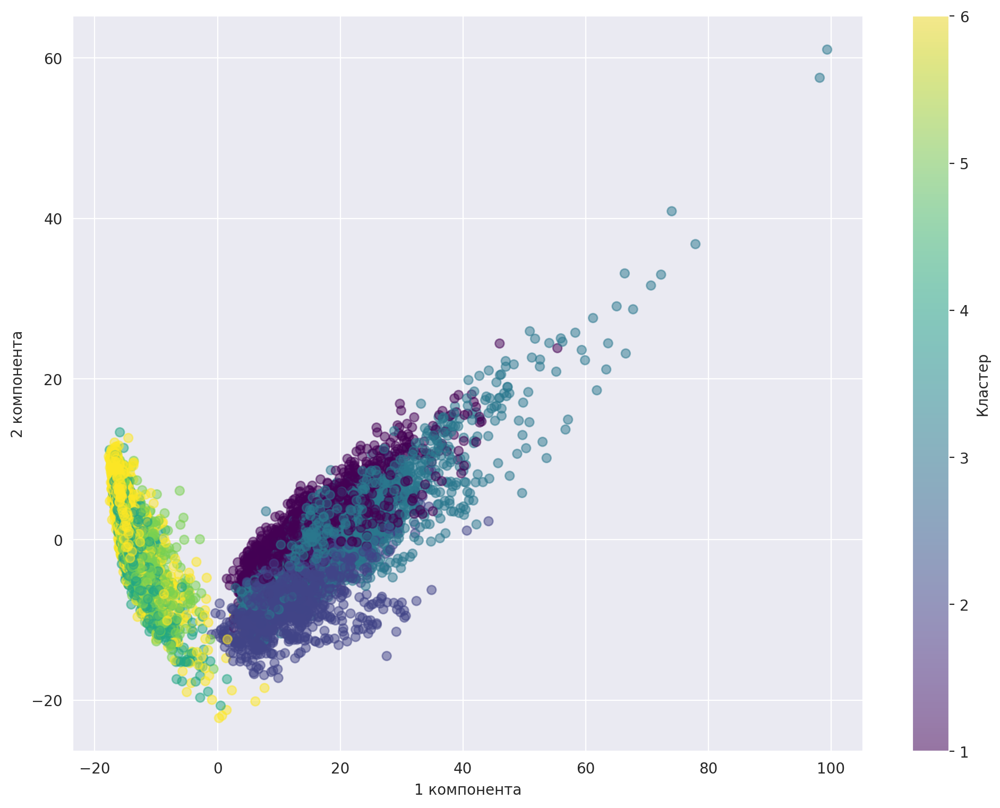

In [25]:
sns.set_style('darkgrid')
plt.rcParams['figure.figsize'] = (12, 9)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap="viridis", alpha=0.5)
plt.colorbar(label="Кластер")
plt.xlabel("1 компонента")
plt.ylabel("2 компонента")
plt.show()

### **Задание 19. (0.5 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [26]:
from sklearn.cluster import KMeans
import time

start_train = time.time()
kmeans = KMeans(n_clusters=6, n_init=100, random_state=RANDOM_STATE)
kmeans.fit(X_pca)
end_train = time.time()

start_infer = time.time()
clusters = kmeans.predict(X_pca)
end_infer = time.time()

print(f"Время обучения: {end_train - start_train:.4f} сек.")
print(f"Время инференса: {end_infer - start_infer:.4f} сек.")

Время обучения: 10.3136 сек.
Время инференса: 0.0034 сек.


### **Задание 20 (0.2 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

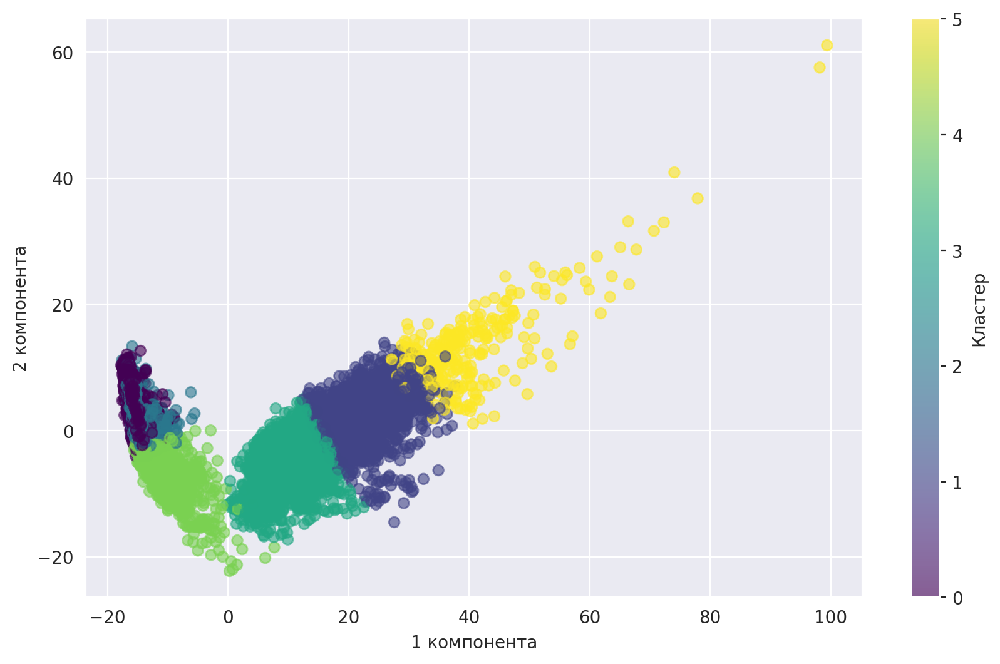

In [32]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap="viridis", alpha=0.6)
plt.colorbar(label="Кластер")
plt.xlabel("1 компонента")
plt.ylabel("2 компонента")
plt.show()

### **Задание 21 (0.3 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [50]:
from sklearn.metrics import silhouette_score

silhouette_score(X_pca, kmeans.labels_)

# кластеры накладываются. в целом ожидаемо

0.14149759467581463

In [45]:
y.values.ravel()

array([5, 5, 5, ..., 2, 2, 2])

In [46]:
from sklearn.metrics import v_measure_score, adjusted_mutual_info_score, homogeneity_score, adjusted_rand_score, completeness_score

v_measure = v_measure_score(y.values.ravel(), clusters)
ami = adjusted_mutual_info_score(y.values.ravel(), clusters)
homogeneity = homogeneity_score(y.values.ravel(), clusters)
ari = adjusted_rand_score(y.values.ravel(), clusters)
completeness = completeness_score(y.values.ravel(), clusters)

print(f"V-Measure: {v_measure:.4f}") # гармоническое среднее гомогенности и полноты
print(f"AMI: {ami:.4f}") # взаимая информация
print(f"Homogeneity: {homogeneity:.4f}")
print(f"ARI: {ari:.4f}") # доля пар объектов, для которых разбиение на классы и кластеры согласованы
print(f"Completeness: {completeness:.4f}")

V-Measure: 0.5600
AMI: 0.5597
Homogeneity: 0.5406
ARI: 0.4195
Completeness: 0.5810


**Средние результаты, не отлично, классы не слишком хорошо сбалансированы. Классы в кластерах перемешиваются.**

### **Задание 22 (0.7 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [47]:
from sklearn.cluster import AgglomerativeClustering

start_time = time.time()

agg_clustering = AgglomerativeClustering(n_clusters=6)
labels_pred_agg = agg_clustering.fit_predict(X_pca)

print(f"{time.time() - start_time:.4f} сек.")

9.2659 сек.


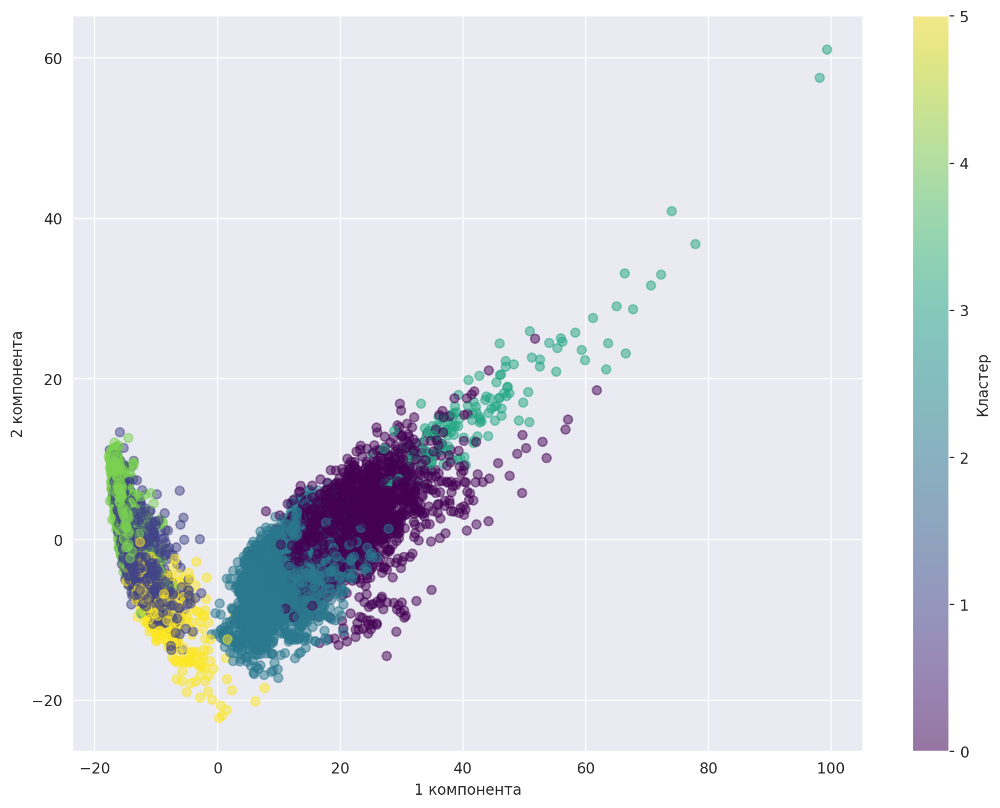

In [48]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels_pred_agg, cmap="viridis", alpha=0.5)
plt.colorbar(label="Кластер")
plt.xlabel("1 компонента")
plt.ylabel("2 компонента")
plt.show()

# уже визуально стало лучше! больше похоже на реальные значения y

In [49]:
v_measure = v_measure_score(y.values.ravel(), labels_pred_agg)
ami = adjusted_mutual_info_score(y.values.ravel(), labels_pred_agg)
homogeneity = homogeneity_score(y.values.ravel(), labels_pred_agg)
ari = adjusted_rand_score(y.values.ravel(), labels_pred_agg)
completeness = completeness_score(y.values.ravel(), labels_pred_agg)

print(f"V-Measure: {v_measure:.4f}")
print(f"AMI: {ami:.4f}")
print(f"Homogeneity: {homogeneity:.4f}")
print(f"ARI: {ari:.4f}")
print(f"Completeness: {completeness:.4f}")

# по всем метрикам видно улучшение

V-Measure: 0.6218
AMI: 0.6215
Homogeneity: 0.5779
ARI: 0.4936
Completeness: 0.6729


**AgglomerativeClustering лучше подходит для сложных кластерных структур – если данные имеют иерархическую природу, то он скорее всего выделит кластеры точнее. На наших данных еще и обучался не дольше, чем Kmeans.**

### **Задание 23 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

In [53]:
labels_pred_agg

array([1, 1, 1, ..., 2, 2, 2])

In [71]:
y["cluster"] = labels_pred_agg
y = y.rename(columns={0: "target"})

In [72]:
y.groupby("cluster").mean()

,target
cluster,
0,2.150811
1,4.571429
2,1.661758
3,2.653333
4,5.915224
5,5.244353


In [74]:
y.target.value_counts()

,count
target,
6,1944
5,1906
4,1777
1,1722
2,1544
3,1406


**Кластеры в целом соотносятся с целевыми метками, но не идеально. Кластер 3 получился средним между 2 и 3, значит, он содержит смешанные активности - подъем/ спуск по лестнице похожи в признаковом пространстве. С ходьбой не очень задалось, видимо, ее тоже легко перепутать с другими типами движения. Зато стояние/ лежание определяются лучше**

## **Бонус-задание (1 балл)**
![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. В бонусе предлагаем вам попрактиковаться именно в этом на чудесной утке и совах (```duck.jpg``` и ```owls.jpg```)

### **(0.1 балл)**

- Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

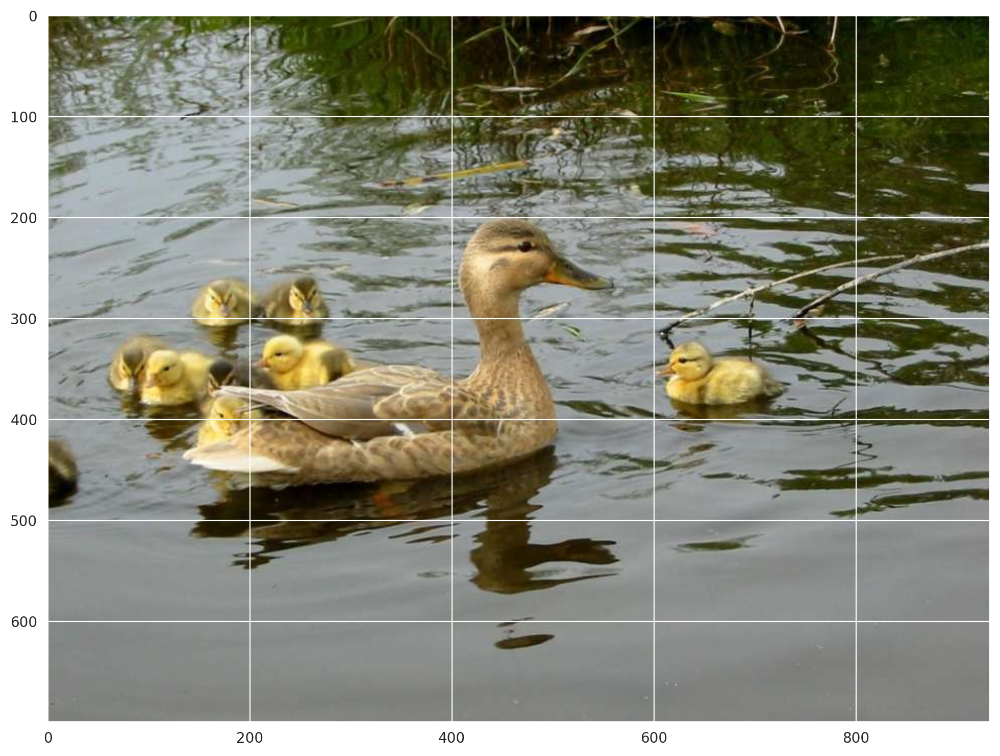

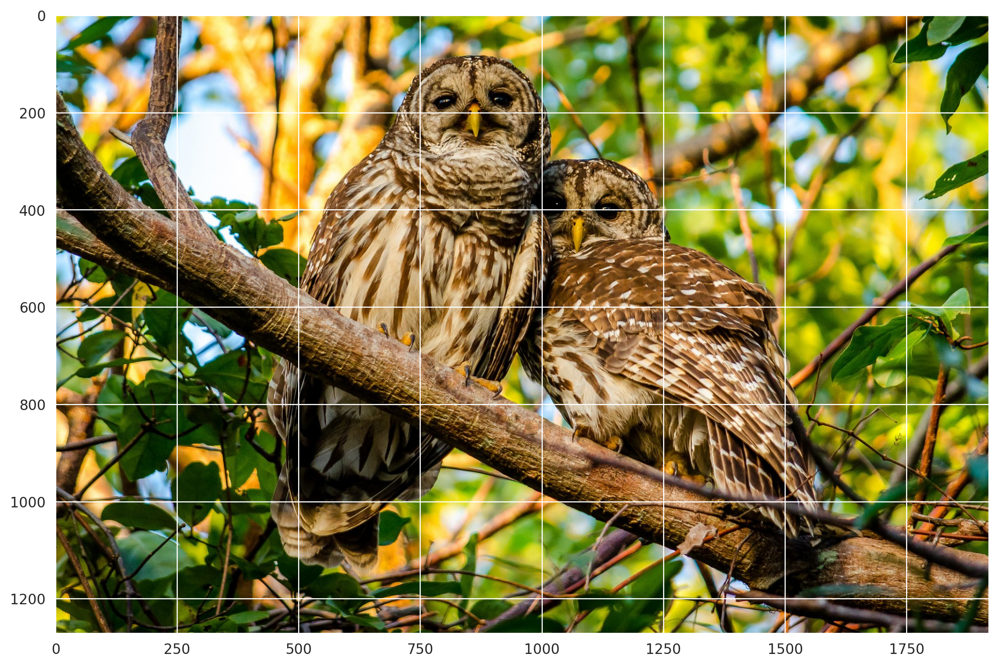

In [81]:
from PIL import Image
# or
#import cv2

duck = Image.open("duck.jpg")
owls = Image.open("Owls.jpg")

plt.imshow(duck)
plt.show()

plt.imshow(owls)
plt.show()

### **(0.4 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :) )

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [82]:
def find_components(image, lmbd, n_clusters):
    image = np.array(image)
    h, w, _ = image.shape

    X, Y = np.meshgrid(np.arange(w), np.arange(h))
    features = np.column_stack((lmbd * X.ravel(), lmbd * Y.ravel(),
                                image[:, :, 0].ravel(),
                                image[:, :, 1].ravel(),
                                image[:, :, 2].ravel()))

    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    labels = kmeans.fit_predict(features)

    segmented_image = labels.reshape(h, w)

    return segmented_image

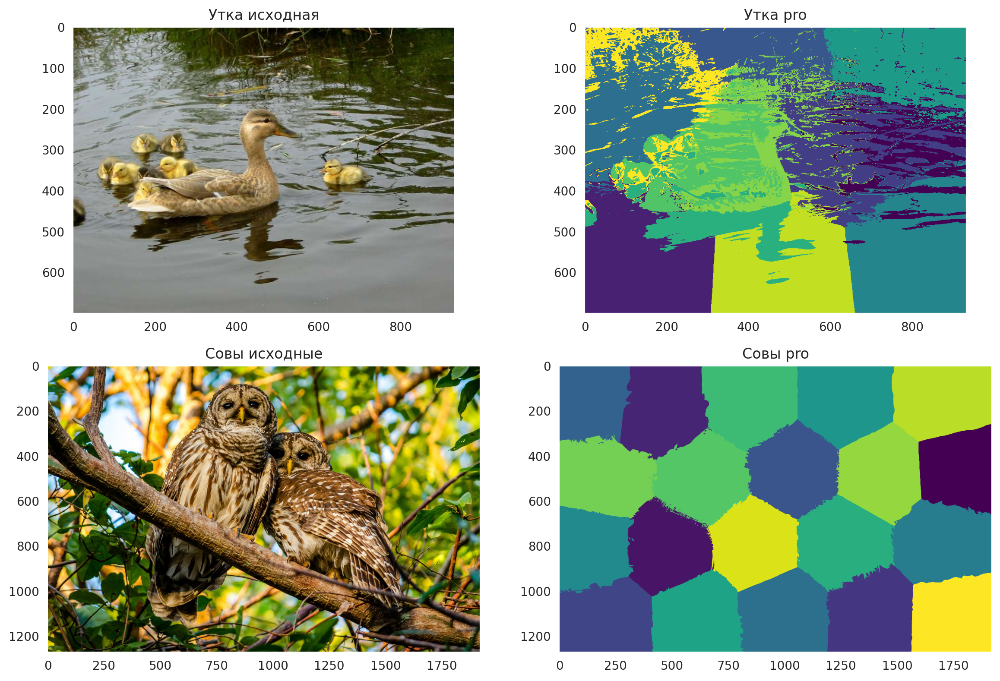

In [87]:
duck_segmented = find_components(duck, lmbd=0.3, n_clusters=12)
owls_segmented = find_components(owls, lmbd=1.5, n_clusters=20)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(duck)
axes[0, 0].set_title("Утка исходная")
axes[0, 0].grid(False)
axes[0, 1].imshow(duck_segmented, cmap="viridis")
axes[0, 1].set_title("Утка pro")
axes[0, 1].grid(False)

axes[1, 0].imshow(owls)
axes[1, 0].set_title("Совы исходные")
axes[1, 0].grid(False)
axes[1, 1].imshow(owls_segmented, cmap="viridis")
axes[1, 1].set_title("Совы pro")
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()


### **(0.4 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [100]:
transform.rescale(color.rgb2gray(np.array(owls)), 0.25, anti_aliasing=True)

array([[0.79272555, 0.79348842, 0.787879  , ..., 0.15308976, 0.21087233,
        0.3645958 ],
       [0.80229317, 0.78578892, 0.77671956, ..., 0.09041549, 0.1256512 ,
        0.22057323],
       [0.80440603, 0.77766509, 0.76291338, ..., 0.05967656, 0.0631559 ,
        0.08315789],
       ...,
       [0.15210334, 0.27426297, 0.35770509, ..., 0.2855347 , 0.3149017 ,
        0.33522753],
       [0.16008458, 0.2248799 , 0.21226144, ..., 0.2951335 , 0.30644754,
        0.32535979],
       [0.27108077, 0.35380208, 0.31082858, ..., 0.25289814, 0.25567597,
        0.28512886]])

In [101]:
from skimage import color, transform
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import kneighbors_graph

def spectral_segmentation(image, n_clusters, beta=5, eps=1e-6):
    image_gray = color.rgb2gray(np.array(image))

    image_resized = transform.rescale(image_gray, 0.5, anti_aliasing=True)
    h, w = image_resized.shape

    X, y = np.meshgrid(np.arange(w), np.arange(h))
    features = np.column_stack((X.ravel(), y.ravel(), image_resized.ravel()))

    affinity_matrix = kneighbors_graph(features, n_neighbors=beta, mode='connectivity', include_self=True)
    affinity_matrix = 0.5 * (affinity_matrix + affinity_matrix.T)
    affinity_matrix.data[affinity_matrix.data < eps] = 0

    clustering = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=42)
    labels = clustering.fit_predict(affinity_matrix)

    return labels.reshape(h, w)

### **(0.1 балл)**
Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.

In [102]:
duck_segmented = spectral_segmentation(duck, n_clusters=3) # с большим количеством совсем надолго подвисало...
owls_segmented = spectral_segmentation(owls, n_clusters=3)

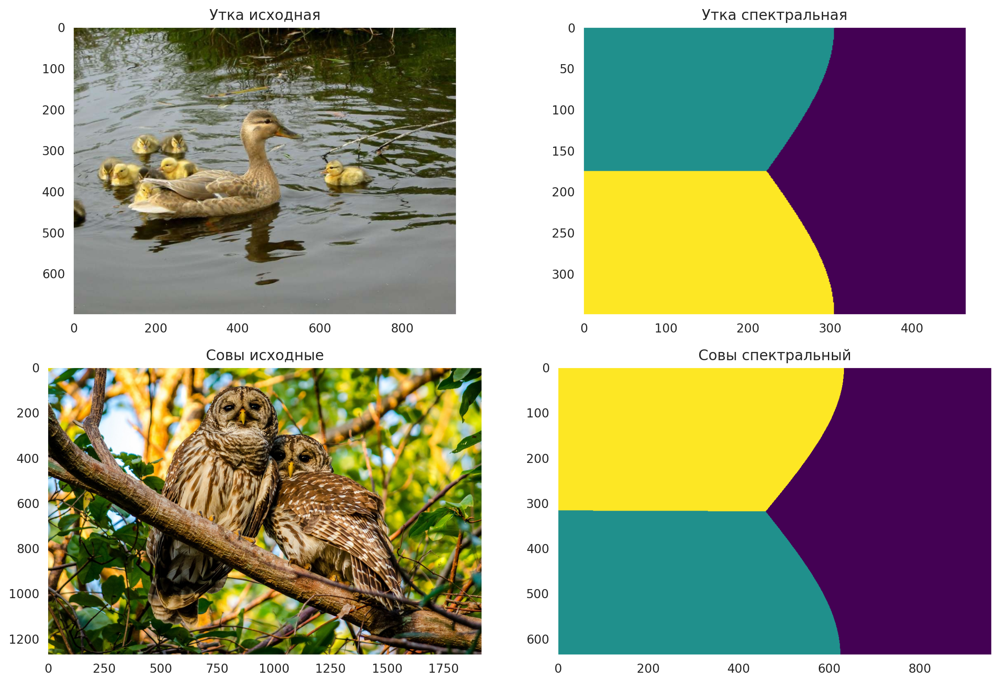

In [103]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(duck)
axes[0, 0].set_title("Утка исходная")
axes[0, 0].grid(False)
axes[0, 1].imshow(duck_segmented, cmap="viridis")
axes[0, 1].set_title("Утка спектральная")
axes[0, 1].grid(False)

axes[1, 0].imshow(owls)
axes[1, 0].set_title("Совы исходные")
axes[1, 0].grid(False)
axes[1, 1].imshow(owls_segmented, cmap="viridis")
axes[1, 1].set_title("Совы спектральный")
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()

**Спасибо! Вы — человек — большой трудяга!**

Успокоительный котобонус :)

Сабрины?

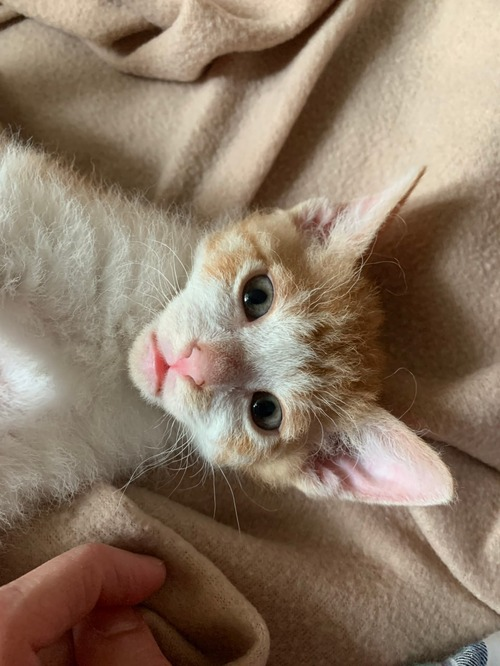